In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
!ls /content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024

planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif
planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif.aux.xml
planet_feat_10_Oct_feat10_Oct_res0_00000587_resampled.tif
planet_feat_11_Oct_feat11_Oct_res0_00000587_resampled.tif
planet_feat_12_Nov_feat12_Nov_res0_00000587_resampled.tif
planet_feat_13_Nov_feat13_Nov_res0_00000587_resampled.tif
planet_feat_14_Nov_feat14_Nov_res0_00000587_resampled.tif
planet_feat_15_Oct_feat15_Oct_res0_00000587_resampled.tif
planet_feat_16_Oct_feat16_Oct_res0_00000587_resampled.tif
planet_feat_17_Oct_feat17_Oct_res0_00000587_resampled.tif
planet_feat_18_Nov_feat18_Nov_res0_00000587_resampled.tif
planet_feat_19_Oct_feat19_Oct_res0_00000587_resampled.tif
planet_feat_1_Oct_feat1_Oct_res0_00000587_resampled.tif
planet_feat_1_Oct_feat1_Oct_res0_00000587_resampled.tif.aux.xml
planet_feat_20_Nov_feat20_Nov_res0_00000587_resampled.tif
planet_feat_21_Nov_feat21_Nov_res0_00000587_resampled.tif
planet_feat_22_Nov_feat22_Nov_res0_00000587_resampled.tif
planet

In [3]:
!ls /content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024

naip_feat_0_Oct.tif	     naip_feat_40_Nov.tif
naip_feat_10_Oct.tif	     naip_feat_41_Oct.tif
naip_feat_11_Oct.tif	     naip_feat_42_Oct.tif
naip_feat_12_Nov.tif	     naip_feat_43_Nov.tif
naip_feat_13_Nov.tif	     naip_feat_44_Nov.tif
naip_feat_14_Nov.tif	     naip_feat_45_Oct.tif
naip_feat_15_Oct.tif	     naip_feat_46_Nov.tif
naip_feat_16_Oct.tif	     naip_feat_47_Nov.tif
naip_feat_17_Oct.tif	     naip_feat_48_Nov.tif
naip_feat_18_Nov.tif	     naip_feat_49_Nov.tif
naip_feat_19_Oct.tif	     naip_feat_4_Nov.tif
naip_feat_1_Oct.tif	     naip_feat_50_Nov.tif
naip_feat_1_Oct.tif.aux.xml  naip_feat_51_Oct.tif
naip_feat_20_Nov.tif	     naip_feat_52_Nov.tif
naip_feat_21_Nov.tif	     naip_feat_52_Nov.tif.aux.xml
naip_feat_22_Nov.tif	     naip_feat_53_Oct.tif
naip_feat_23_Oct.tif	     naip_feat_54_Nov.tif
naip_feat_24_Oct.tif	     naip_feat_55_Oct.tif
naip_feat_25_Oct.tif	     naip_feat_56_Nov.tif
naip_feat_26_Oct.tif	     naip_feat_57_Oct.tif
naip_feat_27_Oct.tif	     naip_feat_58_Oct.tif
naip_

In [4]:
# Install rasterio (quietly) and import
import sys, subprocess
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "rasterio"])

0

Using file: planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif
CRS: EPSG:4326
Size (W x H): 8953 x 3410
Bands: 4 | Resolution: (5.866031004e-06, 5.866031004e-06) | NoData: None
Bounds: BoundingBox(left=-98.0035113, bottom=26.17200653427636, right=-97.95099272442118, top=26.1920097)
Array shape: (4, 3410, 8953) dtype: uint8


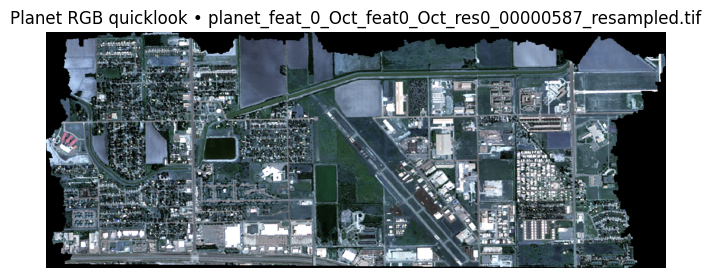

In [5]:
from pathlib import Path
import numpy as np
import rasterio as rio
from rasterio.plot import reshape_as_image
import matplotlib.pyplot as plt

# --- pick a Planet file ---
planet_dir = Path("/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024")
planet_fp = sorted([p for p in planet_dir.glob("*.tif") if not p.name.endswith(".aux.xml")])[0]
print("Using file:", planet_fp.name)

# --- open & print basics ---
with rio.open(planet_fp) as ds:
    print("CRS:", ds.crs)
    print("Size (W x H):", ds.width, "x", ds.height)
    print("Bands:", ds.count, "| Resolution:", ds.res, "| NoData:", ds.nodata)
    print("Bounds:", ds.bounds)

    data = ds.read()  # shape: (bands, H, W)
    print("Array shape:", data.shape, "dtype:", data.dtype)

    # Heuristic: Planet analytic 4-band is usually (B,G,R,NIR)
    # → RGB = (R,G,B) = (3,2,1). If only 3 bands, use (1,2,3).
    if ds.count >= 3:
        if ds.count >= 4:
            rgb_idx = (3, 2, 1)  # R,G,B from B,G,R,NIR
        else:
            rgb_idx = (1, 2, 3)
        rgb = ds.read(rgb_idx)                    # (3,H,W)
        rgb = reshape_as_image(rgb).astype(float) # (H,W,3)

        # Contrast stretch to 2–98 percentile per channel
        rgb_disp = np.zeros_like(rgb, dtype=float)
        for c in range(3):
            ch = rgb[..., c]
            p2, p98 = np.percentile(ch, (2, 98))
            if p98 > p2:
                ch = np.clip((ch - p2) / (p98 - p2), 0, 1)
            else:
                ch = np.zeros_like(ch)
            rgb_disp[..., c] = ch
    else:
        # single-band fallback → grayscale
        band = data[0].astype(float)
        p2, p98 = np.percentile(band, (2, 98))
        gray = np.clip((band - p2) / (p98 - p2 + 1e-9), 0, 1)

# --- plot ---
plt.figure(figsize=(8, 8))
if 'rgb_disp' in locals():
    plt.imshow(rgb_disp)
    plt.title(f"Planet RGB quicklook • {planet_fp.name}")
else:
    plt.imshow(gray, cmap='gray')
    plt.title(f"Planet grayscale quicklook • {planet_fp.name}")
plt.axis('off')
plt.show()

Using Planet file: planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif
Planet info — CRS: EPSG:4326 | Res: (5.866031004e-06, 5.866031004e-06) | Bands: 4
Using NAIP file: naip_feat_0_Oct.tif
NAIP info   — CRS: EPSG:4326 | Res: (5.866031004202908e-06, 5.866031004202908e-06) | Bands: 5


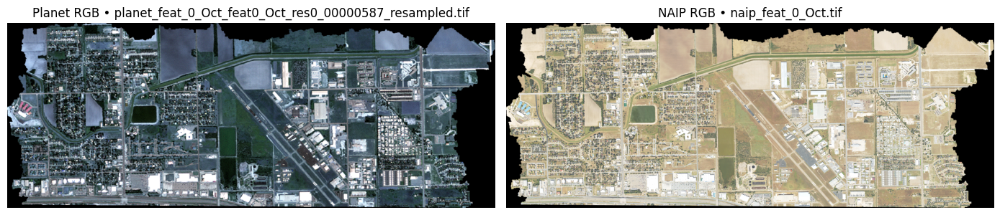

In [6]:
from pathlib import Path
import re
import numpy as np
import rasterio as rio
from rasterio.plot import reshape_as_image
import matplotlib.pyplot as plt

# --- folders ---
planet_dir = Path("/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024")
naip_dir   = Path("/content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024")

# If you don't already have planet_fp, pick one now
if 'planet_fp' not in locals():
    planet_fp = sorted([p for p in planet_dir.glob("*.tif") if not p.name.endswith(".aux.xml")])[0]
print("Using Planet file:", planet_fp.name)

# --- helper: robust contrast stretch 2–98th percentile ---
def contrast_stretch(img_float):
    out = np.zeros_like(img_float, dtype=float)
    for c in range(img_float.shape[-1]):
        ch = img_float[..., c]
        p2, p98 = np.percentile(ch, (2, 98))
        out[..., c] = 0.0 if p98 <= p2 else np.clip((ch - p2) / (p98 - p2), 0, 1)
    return out

# --- build Planet RGB quicklook ---
with rio.open(planet_fp) as pds:
    # Planet 4-band often (B,G,R,NIR) -> RGB = (3,2,1); fallback if only 3 bands
    p_rgb_idx = (3,2,1) if pds.count >= 4 else (1,2,3)
    p_rgb = reshape_as_image(pds.read(p_rgb_idx)).astype(float)
    p_rgb_disp = contrast_stretch(p_rgb)
    p_info = (pds.crs, pds.res, pds.count)

print("Planet info — CRS:", p_info[0], "| Res:", p_info[1], "| Bands:", p_info[2])

# --- find corresponding NAIP by feature index from Planet filename ---
m = re.search(r"planet_feat_(\d+)_", planet_fp.name)
if not m:
    raise ValueError("Could not parse feature index from Planet filename.")
feat_idx = int(m.group(1))

naip_candidates = sorted([p for p in naip_dir.glob(f"naip_feat_{feat_idx}_*.tif") if not p.name.endswith(".aux.xml")])
if not naip_candidates:
    raise FileNotFoundError(f"No NAIP file found for feature {feat_idx}")
naip_fp = naip_candidates[0]
print("Using NAIP file:", naip_fp.name)

# --- build NAIP RGB quicklook ---
with rio.open(naip_fp) as nds:
    # NAIP usually (R,G,B,NIR) or (R,G,B) -> RGB = (1,2,3)
    n_rgb_idx = (1,2,3) if nds.count >= 3 else (1,1,1)
    n_rgb = reshape_as_image(nds.read(n_rgb_idx)).astype(float)
    n_rgb_disp = contrast_stretch(n_rgb)
    n_info = (nds.crs, nds.res, nds.count)

print("NAIP info   — CRS:", n_info[0], "| Res:", n_info[1], "| Bands:", n_info[2])

# --- plot side-by-side ---
plt.figure(figsize=(14, 7))
plt.subplot(1,2,1)
plt.imshow(p_rgb_disp)
plt.title(f"Planet RGB • {planet_fp.name}")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(n_rgb_disp)
plt.title(f"NAIP RGB • {naip_fp.name}")
plt.axis('off')

plt.tight_layout()
plt.show()

In [7]:
p_rgb_disp.shape

(3410, 8953, 3)

In [8]:
n_rgb_disp.shape

(3410, 8953, 3)

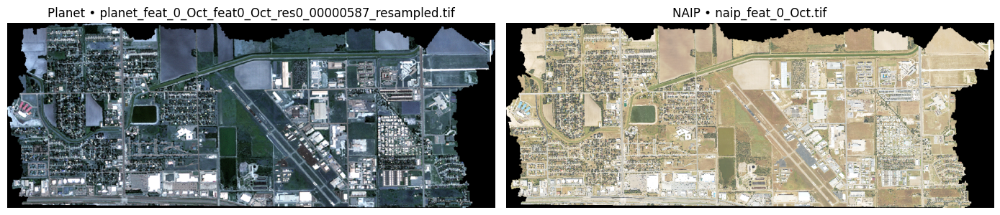

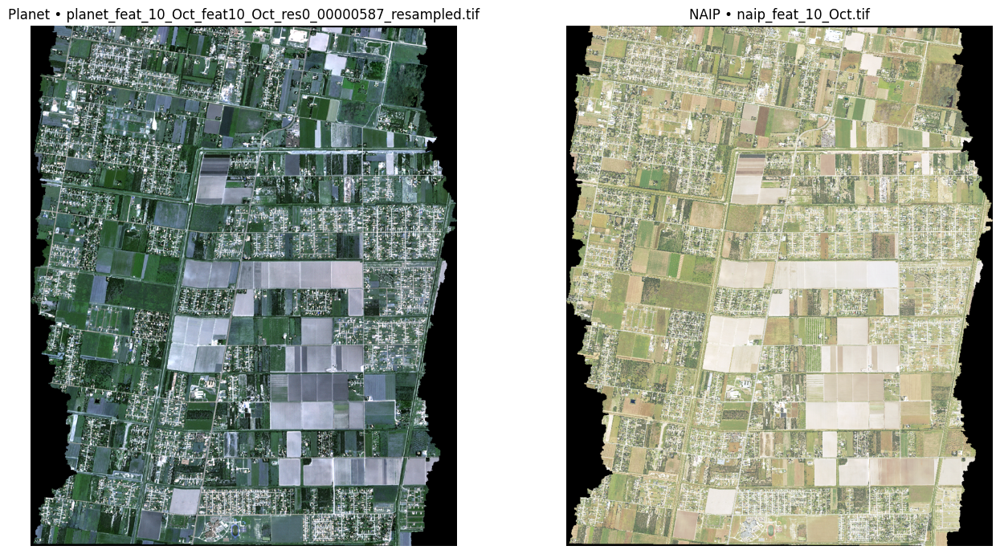

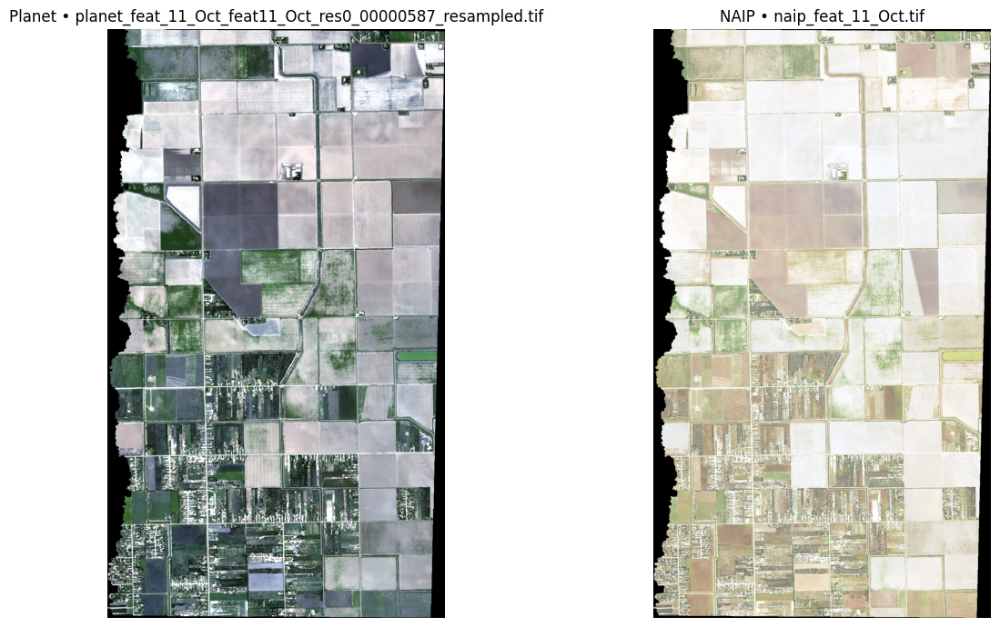

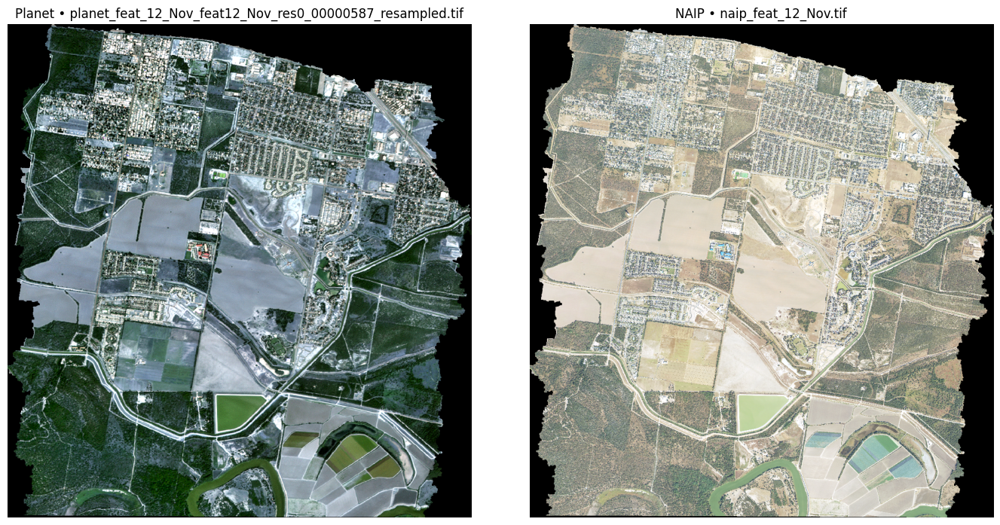

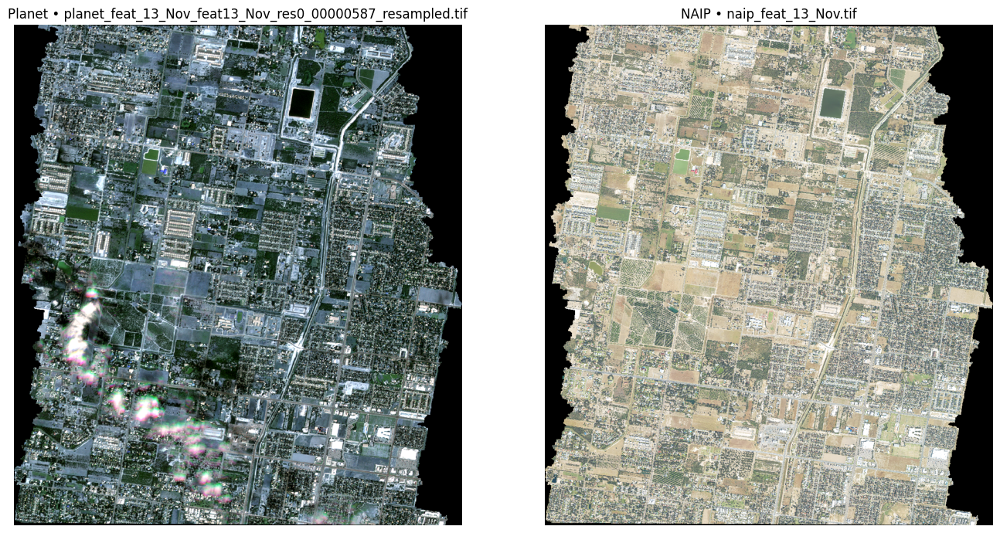

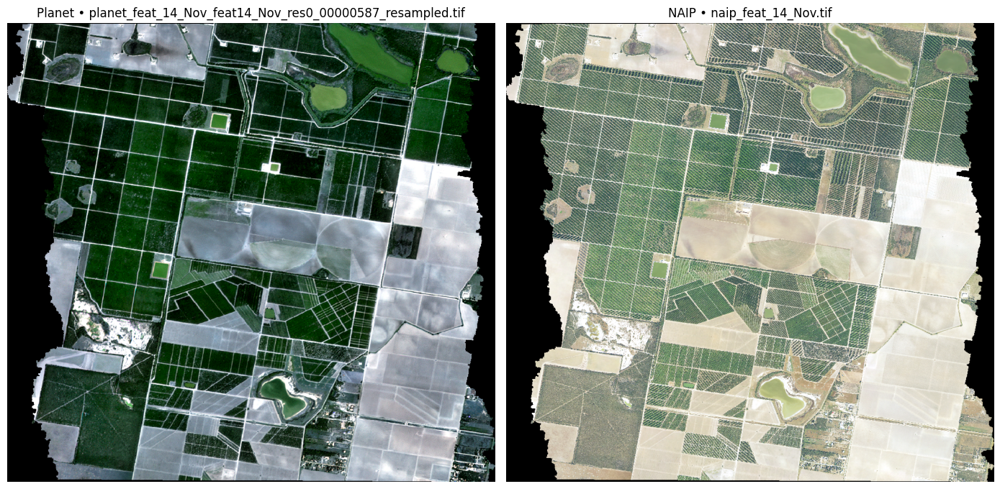

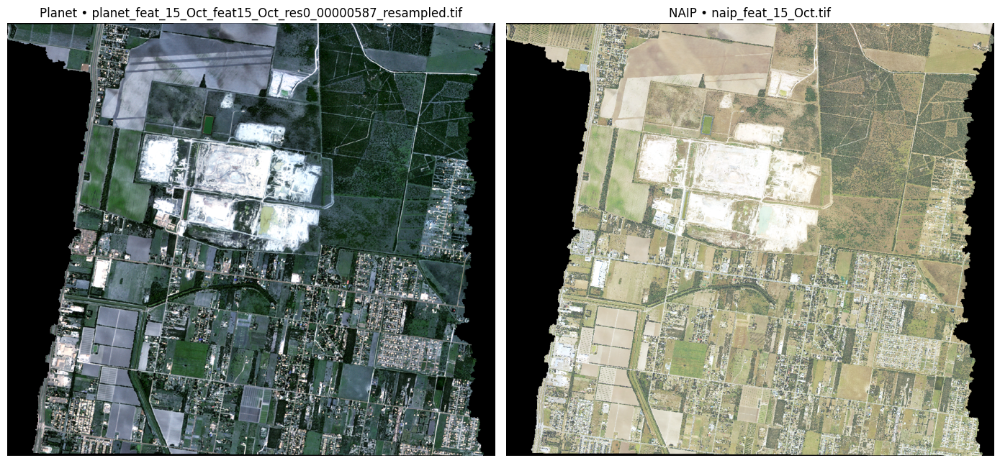

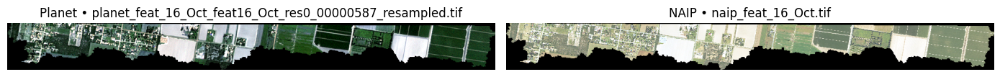

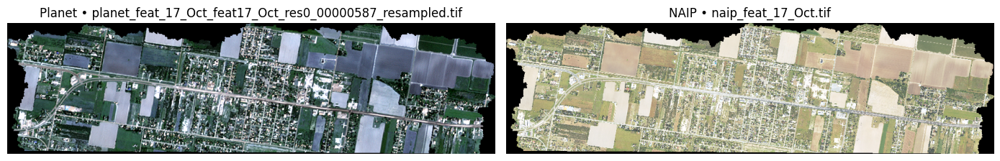

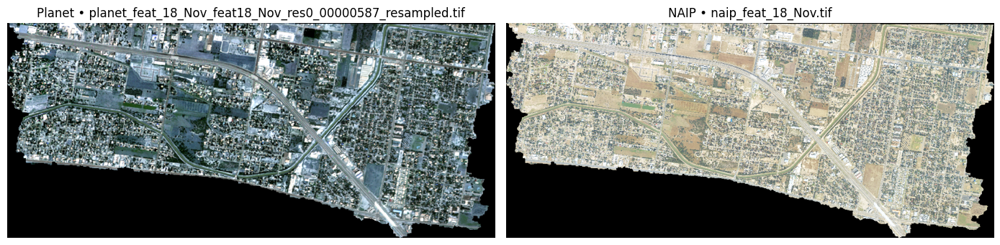

Displayed 10 pair(s). Skipped: 0


In [9]:
from pathlib import Path
import re, gc
import numpy as np
import rasterio as rio
from rasterio.plot import reshape_as_image
import matplotlib.pyplot as plt

planet_dir = Path("/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024")
naip_dir   = Path("/content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024")

MAX_SHOW = 10           # how many pairs to display (set None for all)
TARGET_MAX_WIDTH = 1024 # downsample target width for display (keeps memory/IO low)

def parse_feat_idx(fname):
    m = re.search(r"planet_feat_(\d+)_", fname)
    if not m: raise ValueError(f"Could not parse feature index from {fname}")
    return int(m.group(1))

def contrast_stretch(img_float):
    out = np.zeros_like(img_float, dtype=float)
    for c in range(img_float.shape[-1]):
        ch = img_float[..., c]
        p2, p98 = np.percentile(ch, (2, 98))
        out[..., c] = 0.0 if p98 <= p2 else np.clip((ch - p2) / (p98 - p2), 0, 1)
    return out

def read_rgb_quicklook(path, is_planet=False, target_max_width=1024):
    """Returns (H,W,3) float image, downsampled for display."""
    with rio.open(path) as ds:
        # select band indices
        if is_planet:
            # Planet often (B,G,R,NIR) → RGB=(3,2,1); fallback if 3 bands
            idx = (3,2,1) if ds.count >= 4 else (1,2,3)
        else:
            # NAIP typically (R,G,B,NIR) or (R,G,B)
            idx = (1,2,3) if ds.count >= 3 else (1,1,1)

        # compute out_shape for downsampling
        scale = 1.0
        if ds.width > target_max_width:
            scale = target_max_width / ds.width
        out_h = max(1, int(ds.height * scale))
        out_w = max(1, int(ds.width  * scale))

        arr = ds.read(idx, out_shape=(3, out_h, out_w))  # (3,H,W)
        img = reshape_as_image(arr).astype("float32")     # (H,W,3)
    return img

# main loop
planet_files = sorted([p for p in planet_dir.glob("*.tif") if not p.name.endswith(".aux.xml")])
shown, skipped = 0, []

for pf in planet_files:
    if MAX_SHOW is not None and shown >= MAX_SHOW:
        break
    try:
        feat = parse_feat_idx(pf.name)
        # match NAIP
        naip_cands = sorted([p for p in naip_dir.glob(f"naip_feat_{feat}_*.tif") if not p.name.endswith(".aux.xml")])
        if not naip_cands:
            skipped.append((pf.name, "no matching NAIP"))
            continue
        nf = naip_cands[0]

        # read small previews
        p_img = read_rgb_quicklook(pf, is_planet=True,  target_max_width=TARGET_MAX_WIDTH)
        n_img = read_rgb_quicklook(nf, is_planet=False, target_max_width=TARGET_MAX_WIDTH)

        # center-crop to same size if tiny mismatch after resampling
        H = min(p_img.shape[0], n_img.shape[0])
        W = min(p_img.shape[1], n_img.shape[1])
        def cc(im):
            dh = (im.shape[0]-H)//2; dw = (im.shape[1]-W)//2
            return im[dh:dh+H, dw:dw+W]
        p_img = cc(p_img); n_img = cc(n_img)

        # stretch
        p_disp = contrast_stretch(p_img)
        n_disp = contrast_stretch(n_img)

        # plot this pair
        plt.figure(figsize=(14,7))
        plt.subplot(1,2,1); plt.imshow(p_disp); plt.title(f"Planet • {pf.name}"); plt.axis('off')
        plt.subplot(1,2,2); plt.imshow(n_disp); plt.title(f"NAIP • {nf.name}");   plt.axis('off')
        plt.tight_layout(); plt.show()

        shown += 1
        # free memory for next iteration
        del p_img, n_img, p_disp, n_disp
        gc.collect()

    except Exception as e:
        skipped.append((pf.name, str(e)))
        continue

print(f"Displayed {shown} pair(s). Skipped: {len(skipped)}")
if skipped:
    print("First few skipped:", skipped[:5])

# Run from here

In [10]:
from pathlib import Path
import re, sys
import numpy as np
import rasterio as rio

# tqdm (install if missing)
try:
    from tqdm.auto import tqdm
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "tqdm"])
    from tqdm.auto import tqdm

planet_dir = Path("/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024")
naip_dir   = Path("/content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024")

SHOW_BLOCK_PROGRESS = False  # set True to see a bar per file over blocks

def parse_feat_idx(fname):
    m = re.search(r"planet_feat_(\d+)_", fname)
    if not m:
        raise ValueError(f"Could not parse feature index from {fname}")
    return int(m.group(1))

def update_global_minmax(global_dict, per_file_stats):
    for b, (mn, mx) in per_file_stats.items():
        if mn is None or mx is None:
            continue
        if b not in global_dict:
            global_dict[b] = [mn, mx]
        else:
            if mn < global_dict[b][0]: global_dict[b][0] = mn
            if mx > global_dict[b][1]: global_dict[b][1] = mx

def per_file_minmax(path, show_blocks=False):
    """Stream over blocks; return {band_index: (min,max)}."""
    stats = {}
    with rio.open(path) as ds:
        nodata = ds.nodata
        block_iter = list(ds.block_windows(1))  # list for length
        it = block_iter if show_blocks else ds.block_windows(1)
        if show_blocks:
            it = tqdm(block_iter, desc=f"Blocks: {path.name}", leave=False)
        for ji, win in it:
            arr = ds.read(indexes=list(range(1, ds.count+1)), window=win, masked=True)
            for bi in range(ds.count):
                band_idx = bi + 1
                band = arr[bi]
                if band.mask.all():
                    continue
                bmin = band.min()
                bmax = band.max()
                bmin = float(bmin) if np.issubdtype(band.dtype, np.floating) else bmin.item()
                bmax = float(bmax) if np.issubdtype(band.dtype, np.floating) else bmax.item()
                if band_idx not in stats:
                    stats[band_idx] = [bmin, bmax]
                else:
                    if bmin < stats[band_idx][0]: stats[band_idx][0] = bmin
                    if bmax > stats[band_idx][1]: stats[band_idx][1] = bmax
    return {k: (v[0], v[1]) for k, v in stats.items()}

# ------------ main: aggregate over all paired Planet/NAIP files ------------
planet_files = sorted([p for p in planet_dir.glob("*.tif") if not p.name.endswith(".aux.xml")])

planet_global = {}
naip_global   = {}
skipped = []

for pf in tqdm(planet_files, desc="Processing Planet/NAIP pairs"):
    try:
        feat = parse_feat_idx(pf.name)
        naip_cands = sorted([p for p in naip_dir.glob(f"naip_feat_{feat}_*.tif") if not p.name.endswith(".aux.xml")])
        if not naip_cands:
            skipped.append((pf.name, "no matching NAIP"))
            continue
        nf = naip_cands[0]

        # p_stats = per_file_minmax(pf, show_blocks=SHOW_BLOCK_PROGRESS)
        # n_stats = per_file_minmax(nf, show_blocks=SHOW_BLOCK_PROGRESS)

        # update_global_minmax(planet_global, p_stats)
        # update_global_minmax(naip_global, n_stats)

    except Exception as e:
        skipped.append((pf.name, str(e)))
        continue

# ------------ pretty print results ------------
def pretty_print(title, stats_dict):
    print(f"\n=== {title} (native band order) ===")
    for b in sorted(stats_dict.keys()):
        mn, mx = stats_dict[b]
        print(f"Band {b}: min={mn}  max={mx}")

pretty_print("PLANET global min/max", planet_global)
pretty_print("NAIP   global min/max", naip_global)

print(f"\nSkipped pairs: {len(skipped)}")
if skipped:
    print("First few skipped:", skipped[:5])

Processing Planet/NAIP pairs:   0%|          | 0/67 [00:00<?, ?it/s]


=== PLANET global min/max (native band order) ===

=== NAIP   global min/max (native band order) ===

Skipped pairs: 0


In [11]:
!pwd

/content


In [12]:
min_ = 0
max_ = 255

In [13]:
planet_files

[PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_10_Oct_feat10_Oct_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_11_Oct_feat11_Oct_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_12_Nov_feat12_Nov_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_13_Nov_feat13_Nov_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_14_Nov_feat14_Nov_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/planet_feat_15_Oct_feat15_Oct_res0_00000587_resampled.tif'),
 PosixPath('/content/drive/MyDrive/planet__

In [14]:
len(planet_files)

67

# So lets take 35 for training, remaining for test, within train make patches and use 20% of patches for val

# Finding pairs of Planet and NAIP

In [15]:
for pf in tqdm(planet_files, desc="Processing Planet/NAIP pairs"):
    try:
        feat = parse_feat_idx(pf.name)
        naip_cands = sorted([p for p in naip_dir.glob(f"naip_feat_{feat}_*.tif") if not p.name.endswith(".aux.xml")])
        if not naip_cands:
            skipped.append((pf.name, "no matching NAIP"))
            continue
        nf = naip_cands[0]

        print(pf.name)
        print(nf.name)
    except Exception as e:
        skipped.append((pf.name, str(e)))
        continue

Processing Planet/NAIP pairs:   0%|          | 0/67 [00:00<?, ?it/s]

planet_feat_0_Oct_feat0_Oct_res0_00000587_resampled.tif
naip_feat_0_Oct.tif
planet_feat_10_Oct_feat10_Oct_res0_00000587_resampled.tif
naip_feat_10_Oct.tif
planet_feat_11_Oct_feat11_Oct_res0_00000587_resampled.tif
naip_feat_11_Oct.tif
planet_feat_12_Nov_feat12_Nov_res0_00000587_resampled.tif
naip_feat_12_Nov.tif
planet_feat_13_Nov_feat13_Nov_res0_00000587_resampled.tif
naip_feat_13_Nov.tif
planet_feat_14_Nov_feat14_Nov_res0_00000587_resampled.tif
naip_feat_14_Nov.tif
planet_feat_15_Oct_feat15_Oct_res0_00000587_resampled.tif
naip_feat_15_Oct.tif
planet_feat_16_Oct_feat16_Oct_res0_00000587_resampled.tif
naip_feat_16_Oct.tif
planet_feat_17_Oct_feat17_Oct_res0_00000587_resampled.tif
naip_feat_17_Oct.tif
planet_feat_18_Nov_feat18_Nov_res0_00000587_resampled.tif
naip_feat_18_Nov.tif
planet_feat_19_Oct_feat19_Oct_res0_00000587_resampled.tif
naip_feat_19_Oct.tif
planet_feat_1_Oct_feat1_Oct_res0_00000587_resampled.tif
naip_feat_1_Oct.tif
planet_feat_20_Nov_feat20_Nov_res0_00000587_resampled.tif


In [16]:
import tifffile as tiff
data_x = tiff.imread('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/'+pf.name)  # NumPy array (H,W[,C])

In [17]:
data_x.shape

(11818, 8926, 4)

In [18]:
data_y = tiff.imread('/content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024/'+nf.name)  # NumPy array (H,W[,C])

In [19]:
data_y.shape

(11818, 8926, 5)

In [20]:
type(data_x)

numpy.ndarray

In [22]:
import numpy as np

def unpatchify(patches, img_shape):
    patch_size = patches.shape[1]
    assert patches.shape[0] == (img_shape[0] // patch_size) * (img_shape[1] // patch_size), "Patches and image shape are not compatible"

    img = np.zeros(img_shape, dtype=patches.dtype)
    patch_idx = 0

    for i in range(0, img_shape[0], patch_size):
        for j in range(0, img_shape[1], patch_size):
            img[i:i + patch_size, j:j + patch_size] = patches[patch_idx]
            patch_idx += 1

    return img

def patchify(img, patch_size):
    img_shape = img.shape
    patches = np.array([img[i:i + patch_size, j:j + patch_size] for i in range(0, img_shape[0], patch_size) for j in range(0, img_shape[1], patch_size)])
    return patches

In [39]:
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import torch.optim as optim
class ncDataset(Dataset):
    def __init__(self, data, targets):
        self.data = data
        self.targets = targets

    def __getitem__(self, index):
        x = torch.from_numpy(self.data[index])
        y = torch.from_numpy(self.targets[index])
        # x = self.data[index]
        # y = self.targets[index]
        # x = x.to(dtype=torch.float32)
        # y = y.to(dtype=torch.float32)
        return x, y

    def __len__(self):
        return len(self.data)

In [62]:
def train(model, train_dataloader, val_dataloader, criterion, optimizer, device):
    model.train()
    train_loss = 0.0
    for batch in train_dataloader:
        lr, hr = batch
        lr, hr = lr.to(device), hr.to(device)
        lr = lr.to(device, dtype=torch.float32)
        hr = hr.to(device, dtype=torch.float32)
        optimizer.zero_grad()
        sr = model(lr)
        loss = criterion(sr, hr)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_dataloader)

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in val_dataloader:
            lr, hr = batch
            lr, hr = lr.to(device), hr.to(device)
            lr = lr.to(device, dtype=torch.float32)
            hr = hr.to(device, dtype=torch.float32)
            sr = model(lr)
            loss = criterion(sr, hr)
            val_loss += loss.item()

    val_loss /= len(val_dataloader)

    return train_loss, val_loss

In [63]:
# Create patches from the image
patch_size = 128
int(x_train.shape[0]/patch_size)

92

In [64]:
img = x_train[:int(x_train.shape[0]/patch_size)*patch_size,:int(x_train.shape[1]/patch_size)*patch_size]
patches = patchify(img, patch_size)

In [65]:
# Reconstruct the image from the patches
reconstructed_img = unpatchify(patches, img.shape)

In [66]:
img.shape, patches.shape, reconstructed_img.shape

((11776, 8832, 4), (6348, 128, 128, 4), (11776, 8832, 4))

In [67]:
patches = patches.transpose(0, 3, 1, 2)
patches.shape

(6348, 4, 128, 128)

In [68]:
x_train = data_x
y_train = data_y
x_train_max = float(max_)
y_train_max = float(max_)
x_train = x_train.astype(np.float64) / x_train_max
y_train = y_train.astype(np.float64) / y_train_max

x_train_patches = patchify(x_train[:int(x_train.shape[0]/patch_size)*patch_size,:int(x_train.shape[1]/patch_size)*patch_size], patch_size).transpose(0, 3, 1, 2)
y_train_patches = patchify(y_train[:int(x_train.shape[0]/patch_size)*patch_size,:int(x_train.shape[1]/patch_size)*patch_size], patch_size).transpose(0, 3, 1, 2)
x_train_patches.shape

(6348, 4, 128, 128)

In [69]:
type(x_train.astype(np.float64))

numpy.ndarray

In [70]:
x_val_patches = x_train_patches[int(x_train_patches.shape[0]*0.8):]
y_val_patches = y_train_patches[int(y_train_patches.shape[0]*0.8):]

In [71]:
x_val_patches.shape

(1270, 4, 128, 128)

In [79]:
class SRCNN(nn.Module):
    def __init__(self):
        super(SRCNN, self).__init__()
        self.conv1 = nn.Conv2d(4, 64, kernel_size=9, padding=4)
        self.conv2 = nn.Conv2d(64, 32, kernel_size=1, padding=0)
        self.conv3 = nn.Conv2d(32, 5, kernel_size=5, padding=2)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.conv3(x)
        return x

In [80]:
train_dataset = ncDataset(x_train_patches, y_train_patches)
val_dataset = ncDataset(x_val_patches, y_val_patches)

In [81]:
lr, hr = train_dataset.__getitem__(0)
print(lr.shape, hr.shape, train_dataset.__len__())

torch.Size([4, 128, 128]) torch.Size([5, 128, 128]) 6348


In [90]:
train_dataloader = DataLoader(train_dataset, batch_size=700, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=700, shuffle=True)

In [91]:
for batch in train_dataloader:
    data, targets = batch
    print(data.size())  # Should print torch.Size([16, 1, 30, 30])
    print(targets.size())  # Should print torch.Size([16, 1, 30, 601])
    break

torch.Size([700, 4, 128, 128])
torch.Size([700, 5, 128, 128])


In [92]:
# Initialize the model, loss function, and optimizer
device = 'cuda'
model = SRCNN().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)



In [93]:
from copy import deepcopy

num_epochs = 1000
print_interval = 10
patience = 50
best_val_loss = float('inf')
counter = 0
best_model = None


for epoch in range(1, num_epochs + 1):
    train_loss, val_loss = train(model, train_dataloader, val_dataloader, criterion, optimizer, device)
# Log losses to TensorBoard
    print("Loss Train", train_loss, " Loss Validation ", val_loss, " epoch: ", epoch)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model = deepcopy(model)
        counter = 0
    else:
        counter += 1

    if epoch % print_interval == 0:
        print(f"Epoch [{epoch}/{num_epochs}] - Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    if counter >= patience:
        print("Early stopping triggered.")
        break

Loss Train 0.1218687679618597  Loss Validation  0.06162517890334129  epoch:  1
Loss Train 0.032402113825082776  Loss Validation  0.01939429808408022  epoch:  2
Loss Train 0.017713732831180096  Loss Validation  0.014216664712876081  epoch:  3
Loss Train 0.013786748331040145  Loss Validation  0.013752272818237543  epoch:  4
Loss Train 0.011912527028471231  Loss Validation  0.010589933022856712  epoch:  5
Loss Train 0.0100026766769588  Loss Validation  0.009803897235542536  epoch:  6
Loss Train 0.008664941787719727  Loss Validation  0.007757518673315644  epoch:  7
Loss Train 0.007650259137153626  Loss Validation  0.007032083114609122  epoch:  8
Loss Train 0.0072671609930694105  Loss Validation  0.007159908767789602  epoch:  9
Loss Train 0.0068172408733516935  Loss Validation  0.0062501642387360334  epoch:  10
Epoch [10/1000] - Train Loss: 0.0068, Validation Loss: 0.0063
Loss Train 0.006486036302521825  Loss Validation  0.005882733501493931  epoch:  11
Loss Train 0.0060989900957793  Loss V

KeyboardInterrupt: 

In [98]:
len(planet_files)

67

In [ ]:
num_epochs = 100
print_interval = 10
patience = 50
best_val_loss = float('inf')
counter = 0
best_model = None
planet_files_train = planet_files[:35]

for pf in tqdm(planet_files_train, desc="Processing Planet/NAIP pairs"):
    try:
        feat = parse_feat_idx(pf.name)
        naip_cands = sorted([p for p in naip_dir.glob(f"naip_feat_{feat}_*.tif") if not p.name.endswith(".aux.xml")])
        if not naip_cands:
            skipped.append((pf.name, "no matching NAIP"))
            continue
        nf = naip_cands[0]

        print(pf.name)
        print(nf.name)
        data_x = tiff.imread('/content/drive/MyDrive/planet__resampled_with_naip_Oct_Nov_2024/'+pf.name)  # NumPy array (H,W[,C])
        data_y = tiff.imread('/content/drive/MyDrive/NAIP_clips_seamlines_addmonth_2024/'+nf.name)  # NumPy array (H,W[,C])
        x_train = data_x
        y_train = data_y
        x_train_max = float(max_)
        y_train_max = float(max_)
        x_train = x_train.astype(np.float64) / x_train_max
        y_train = y_train.astype(np.float64) / y_train_max
        x_train_patches = patchify(x_train[:int(x_train.shape[0]/patch_size)*patch_size,:int(x_train.shape[1]/patch_size)*patch_size], patch_size).transpose(0, 3, 1, 2)
        y_train_patches = patchify(y_train[:int(x_train.shape[0]/patch_size)*patch_size,:int(x_train.shape[1]/patch_size)*patch_size], patch_size).transpose(0, 3, 1, 2)
        x_val_patches = x_train_patches[int(x_train_patches.shape[0]*0.8):]
        y_val_patches = y_train_patches[int(y_train_patches.shape[0]*0.8):]
        train_dataset = ncDataset(x_train_patches, y_train_patches)
        val_dataset = ncDataset(x_val_patches, y_val_patches)
        train_dataloader = DataLoader(train_dataset, batch_size=700, shuffle=True)
        val_dataloader = DataLoader(val_dataset, batch_size=700, shuffle=True)
        from copy import deepcopy



        for epoch in range(1, num_epochs + 1):
            train_loss, val_loss = train(model, train_dataloader, val_dataloader, criterion, optimizer, device)
        # Log losses to TensorBoard
            print("Loss Train", train_loss, " Loss Validation ", val_loss, " epoch: ", epoch)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model = deepcopy(model)
                counter = 0
            else:
                counter += 1

            if epoch % print_interval == 0:
                print(f"Epoch [{epoch}/{num_epochs}] - Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

            if counter >= patience:
                print("Early stopping triggered.")
                break

    except Exception as e:
        skipped.append((pf.name, str(e)))
        continue

In [94]:
model_save_path = "best_model_srcnn.pth"

torch.save(best_model.state_dict(), model_save_path)

In [95]:
loaded_model = SRCNN().to(device)
loaded_model.load_state_dict(torch.load(model_save_path))
loaded_model.eval()

SRCNN(
  (conv1): Conv2d(4, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
  (conv3): Conv2d(32, 5, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu): ReLU()
)

In [97]:
x_train_patches_tensor = torch.from_numpy(x_train_patches).to(device)
with torch.no_grad():
    predicted_sr = loaded_model(x_train_patches_tensor.to(device, dtype=torch.float32))
predicted_sr_np = predicted_sr.cpu().numpy() * y_train_max
predicted_sr_np[predicted_sr_np<0] = 0.0

OutOfMemoryError: CUDA out of memory. Tried to allocate 24.80 GiB. GPU 0 has a total capacity of 14.74 GiB of which 5.56 GiB is free. Process 16656 has 9.18 GiB memory in use. Of the allocated memory 8.33 GiB is allocated by PyTorch, and 749.21 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)